# Categoria

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from create_model import model_pycaret,call_model

In [2]:
dataset = pd.read_csv("../dataset/Toneladas/categoria.csv",index_col=0,parse_dates=["Fecha"])

In [3]:
dataset.head()

,Categoria,Fecha,Toneladas
0,03 Servilletas Masivos,2021-03-18,6.781432e+00
1,05 Pañales Bebe,2020-11-06,1.644376e+06
2,11 Toallas Húmedas,2020-03-28,1.870996e+06
3,01 Mascotas,2020-09-04,8.984898e+03
4,05 Pañales Bebe,2020-11-12,3.589994e+06


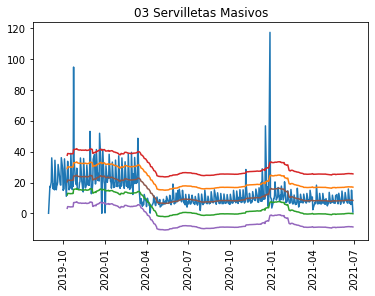

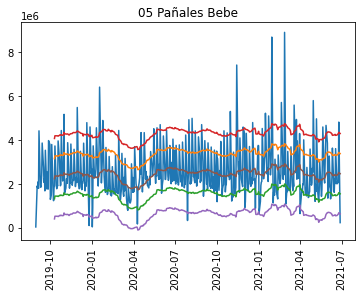

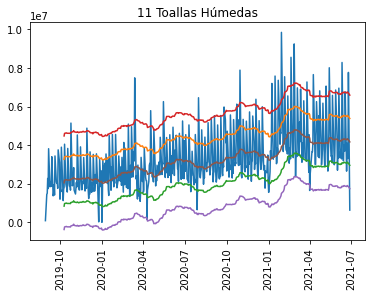

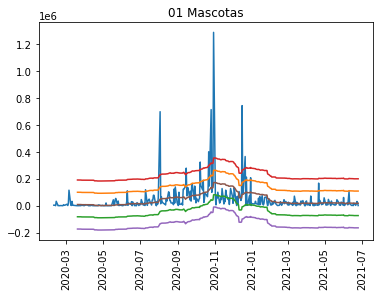

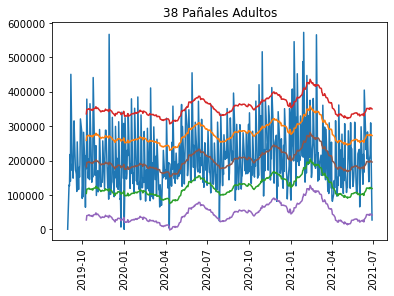

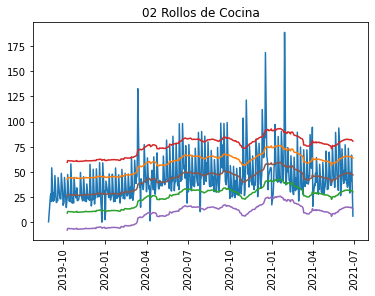

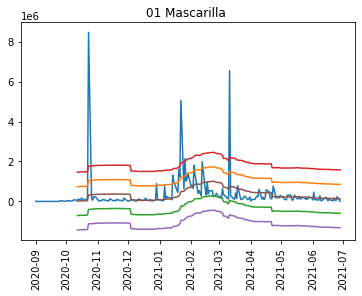

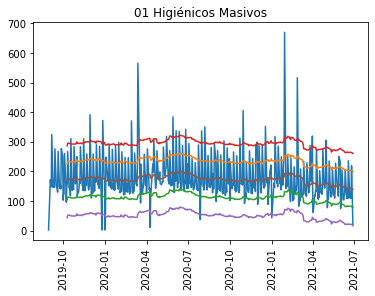

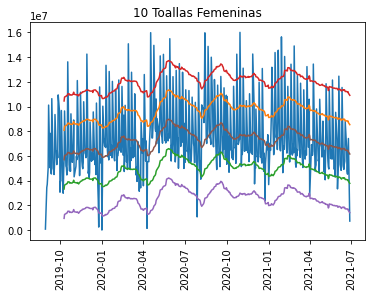

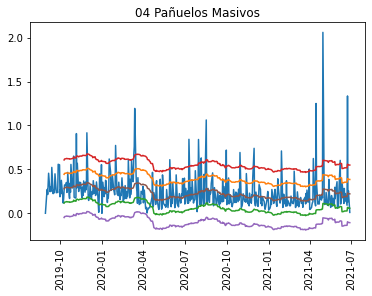

In [4]:
for i in dataset.Categoria.unique():
    subset = dataset[dataset['Categoria']==i].drop('Categoria',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [5]:
model_pycaret(dataset,target="Toneladas",level="Categoria")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.4707,0.3617,0.6014,0.1036,0.2576,1.0783
1,0.5500,0.5613,0.7492,0.0362,0.2553,0.5102
2,0.3920,0.2667,0.5164,0.2193,0.2058,0.3670
3,0.3918,0.2359,0.4857,-0.1616,0.1802,0.2494
4,0.5210,0.7395,0.8600,0.1201,0.2470,0.3135
5,0.5306,0.3874,0.6224,0.1274,0.2292,0.3651
6,0.4803,0.3786,0.6153,-0.1347,0.2334,0.3856
7,0.7170,0.9515,0.9755,-0.2295,0.3126,0.6328
8,0.5321,0.4583,0.6769,0.0727,0.2685,0.5824
9,0.4509,0.2798,0.5290,-0.1955,0.1977,0.2905


In [6]:
concat_df = call_model(dataset,target="Toneladas",level="Categoria")

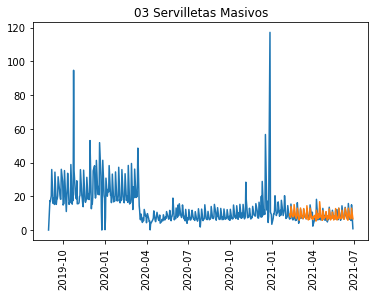

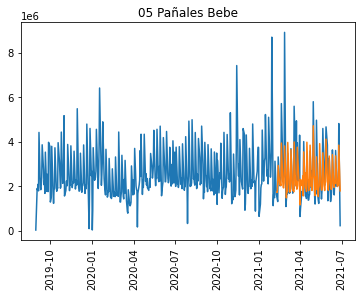

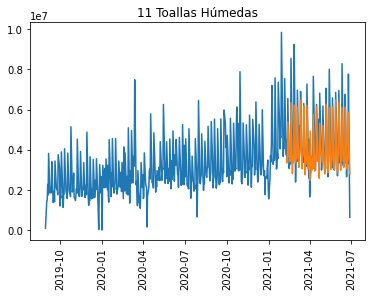

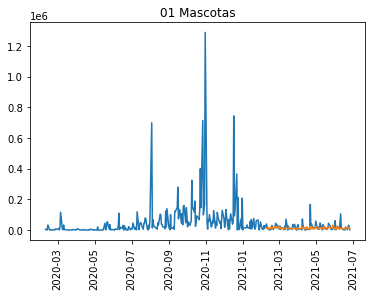

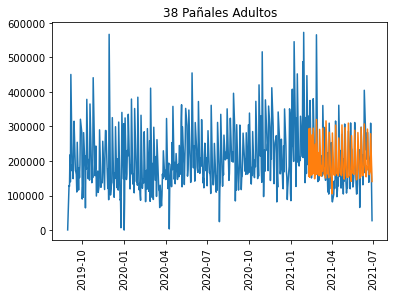

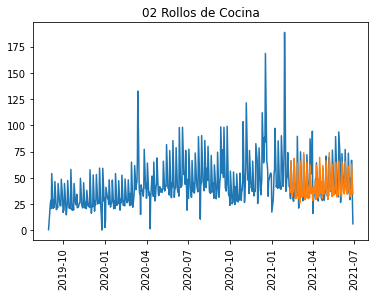

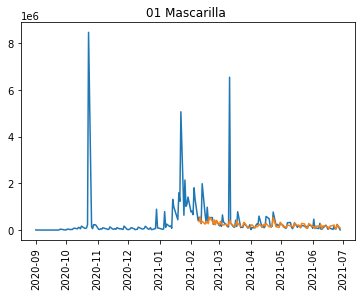

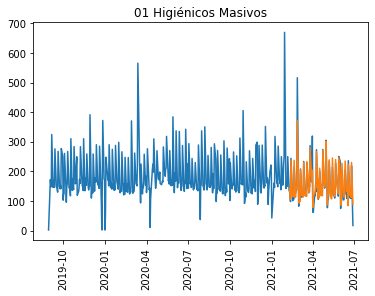

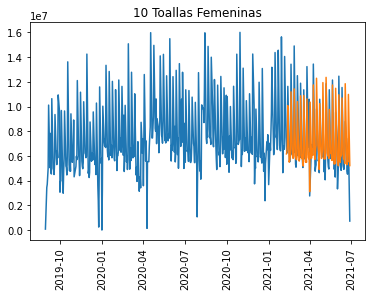

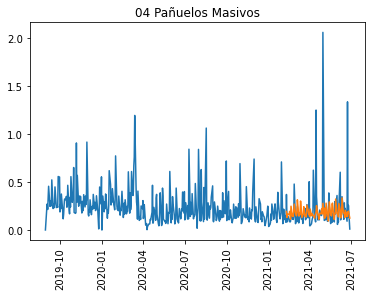

In [7]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Categoria'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Localidad

In [8]:
dataset = pd.read_csv("../dataset/Toneladas/localidad.csv",index_col=0,parse_dates=["Fecha"])

In [9]:
dataset

,Localidad,Fecha,Toneladas
0,AMAZONAS,2019-10-01,11232.642443
1,AMAZONAS,2019-10-02,2400.034635
2,AMAZONAS,2019-10-03,3400.044209
3,AMAZONAS,2019-10-04,18480.385085
4,AMAZONAS,2019-10-05,6912.031864
...,...,...,...
13532,UCAYALI,2021-06-22,110973.304748
13533,UCAYALI,2021-06-23,59365.717703
13534,UCAYALI,2021-06-25,167837.983487
13535,UCAYALI,2021-06-26,54911.211696


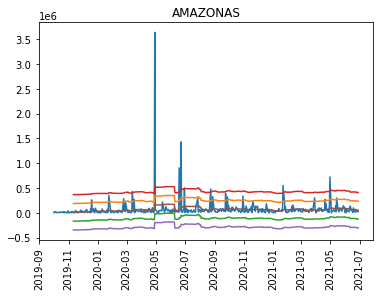

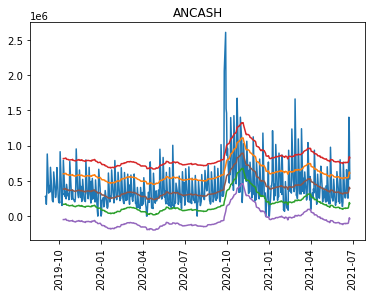

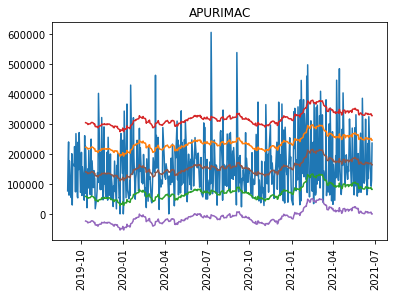

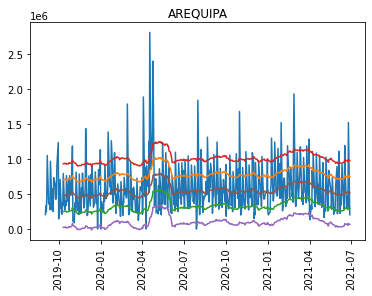

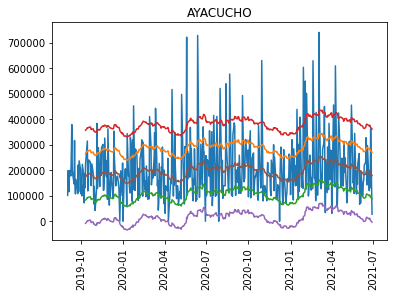

...

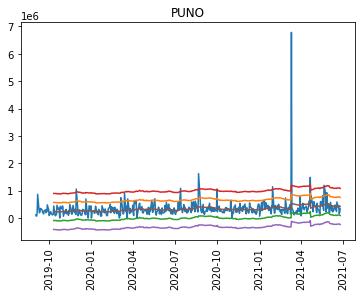

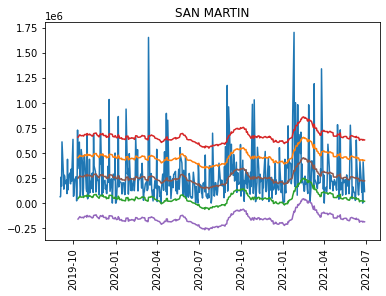

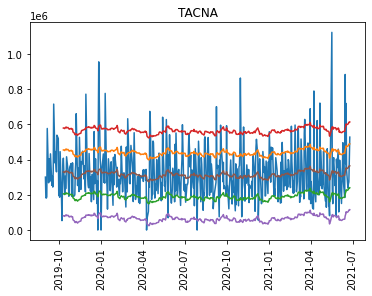

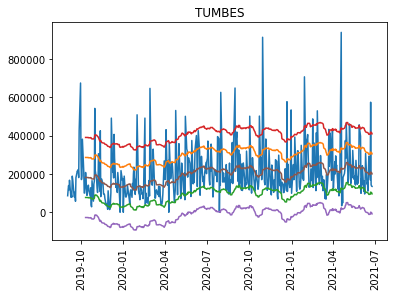

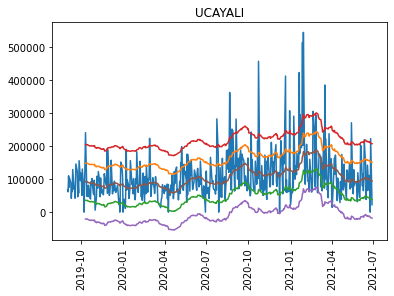

In [10]:
for i in dataset.Localidad.unique():
    subset = dataset[dataset['Localidad']==i].drop('Localidad',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [11]:
model_pycaret(dataset,target="Toneladas",level="Localidad")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.4090,0.2260,0.4754,0.2083,0.0376,0.0353
1,0.4113,0.3221,0.5676,-0.1903,0.0472,0.0377
2,0.4121,0.3251,0.5702,0.0873,0.0452,0.0355
3,0.3912,0.2371,0.4869,0.1007,0.0385,0.0333
4,0.4634,0.3665,0.6054,0.1349,0.0506,0.0422
5,0.3598,0.1955,0.4422,-0.1074,0.0355,0.0320
6,0.4333,0.3195,0.5652,-0.1564,0.0457,0.0380
7,0.3751,0.2418,0.4918,-0.1192,0.0394,0.0331
8,0.5226,0.4803,0.6930,-0.2301,0.0562,0.0459
9,0.5178,0.4645,0.6816,-0.0593,0.0535,0.0438


In [12]:
concat_df = call_model(dataset,target="Toneladas",level="Localidad")

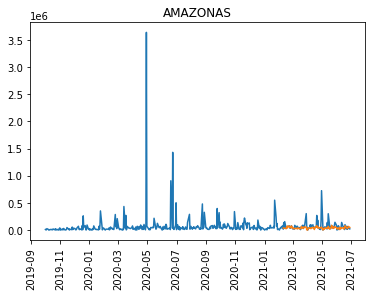

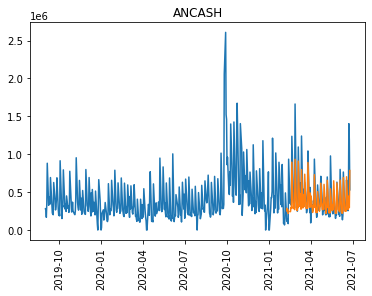

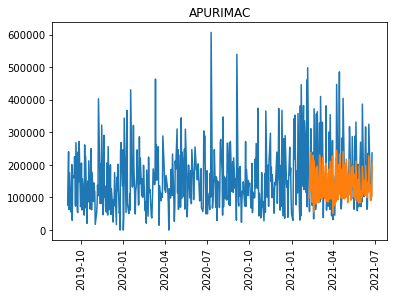

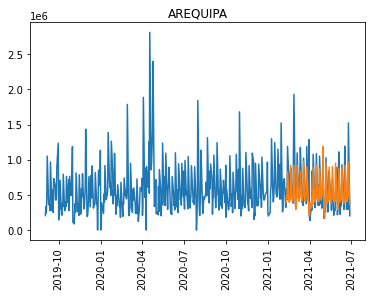

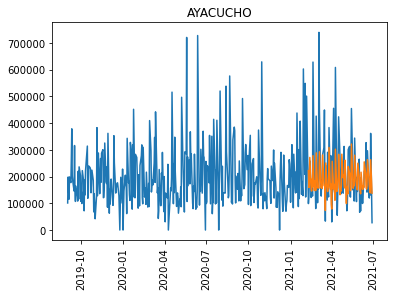

...

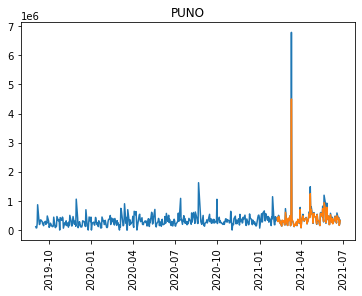

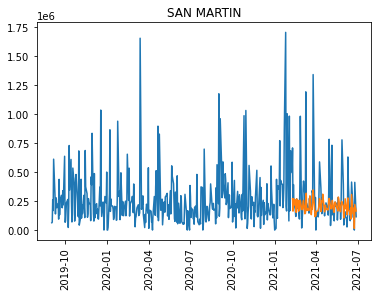

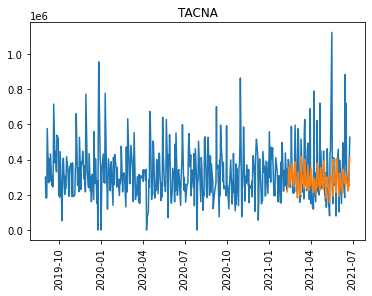

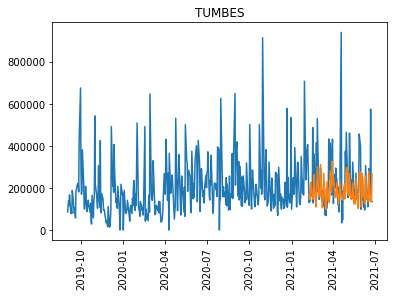

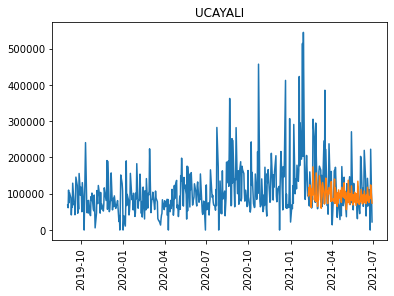

In [13]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Localidad'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Marca

In [14]:
dataset = pd.read_csv("../dataset/Toneladas/marca.csv",index_col=0,parse_dates=["Fecha"])

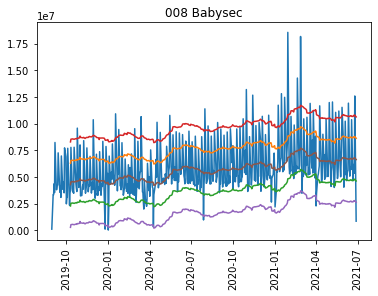

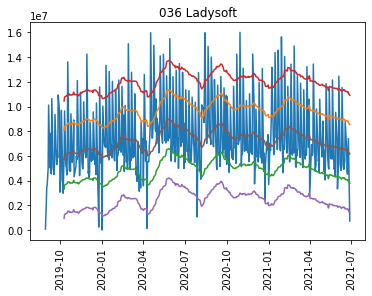

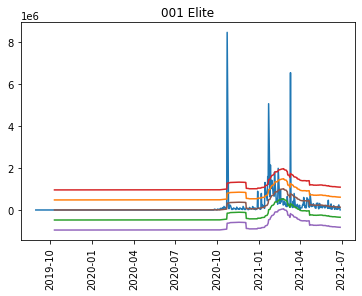

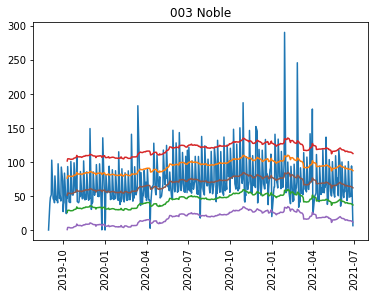

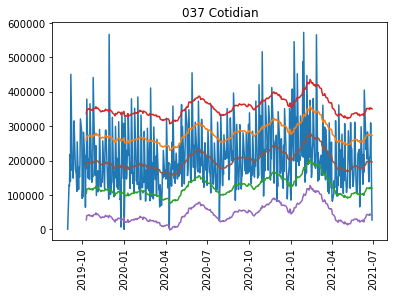

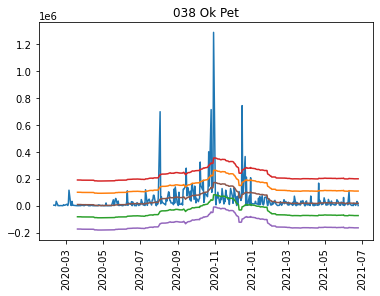

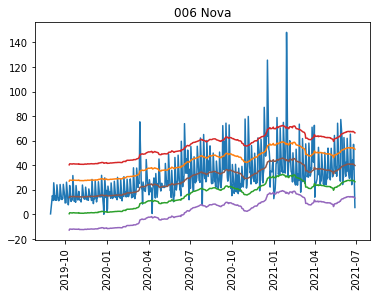

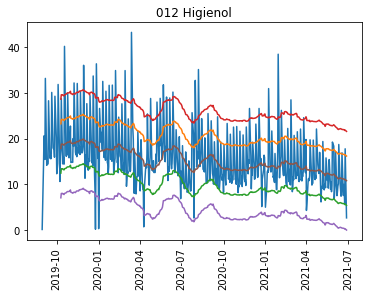

In [15]:
for i in dataset.Marca.unique():
    subset = dataset[dataset['Marca']==i].drop('Marca',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [16]:
model_pycaret(dataset,target="Toneladas",level="Marca")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2187,0.0899,0.2999,0.5046,0.0874,0.0910
1,0.2106,0.1190,0.3450,0.3000,0.1195,0.1150
2,0.2119,0.0651,0.2551,0.1085,0.0698,0.0782
3,0.1592,0.0464,0.2154,0.4769,0.0601,0.0618
4,0.2877,0.3266,0.5715,0.2403,0.1867,0.3541
5,0.2358,0.1057,0.3252,0.3986,0.0979,0.1026
6,0.2153,0.1119,0.3345,-0.2016,0.0993,0.0951
7,0.2998,0.1775,0.4212,0.1466,0.1354,0.1416
8,0.2768,0.1449,0.3807,0.1823,0.1123,0.1240
9,0.2423,0.0833,0.2886,0.3083,0.0799,0.0908


In [17]:
concat_df = call_model(dataset,target="Toneladas",level="Marca")

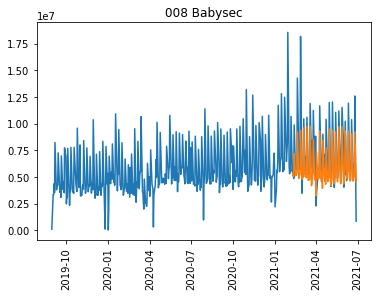

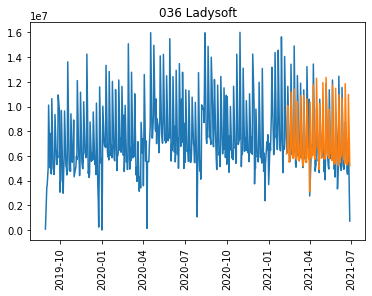

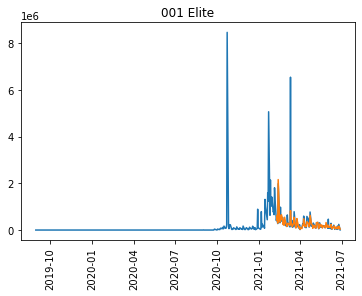

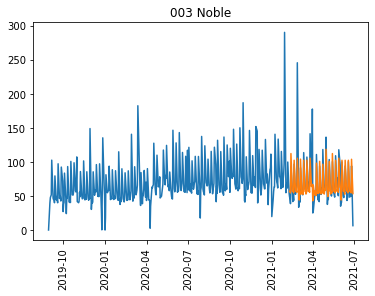

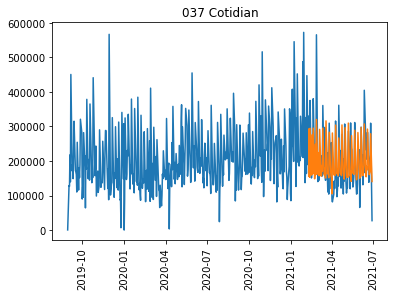

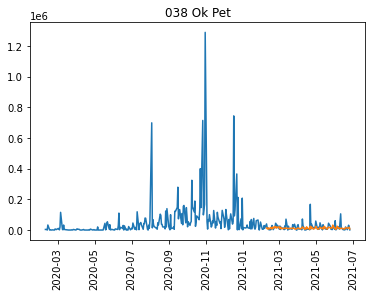

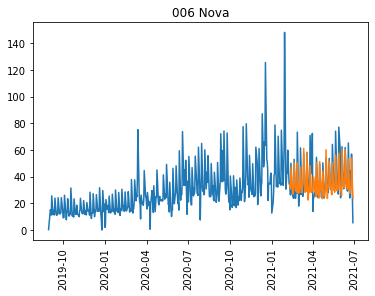

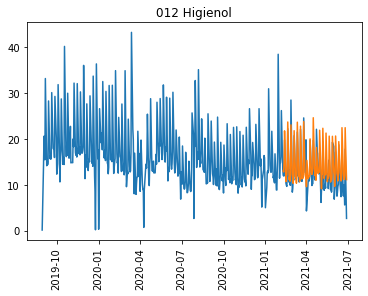

In [18]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Marca'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Nombre Distribuidora

In [19]:
dataset = pd.read_csv("../dataset/Toneladas/distribuidor.csv",index_col=0,parse_dates=["Fecha"])

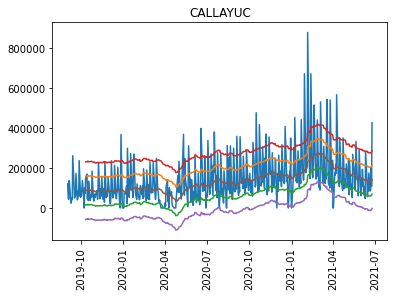

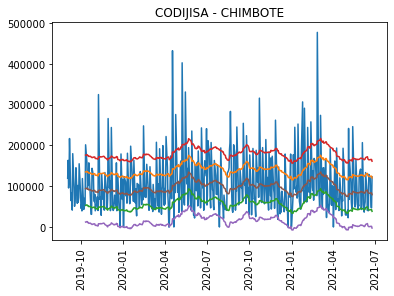

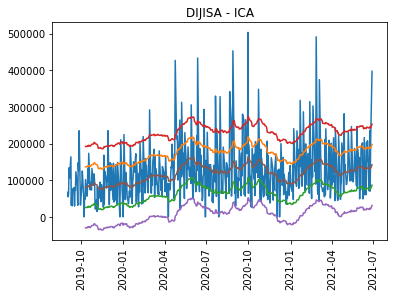

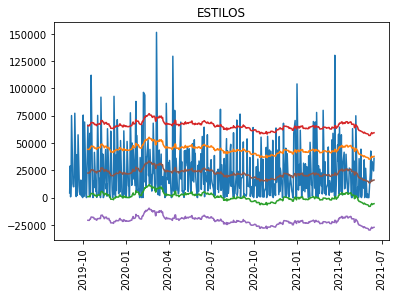

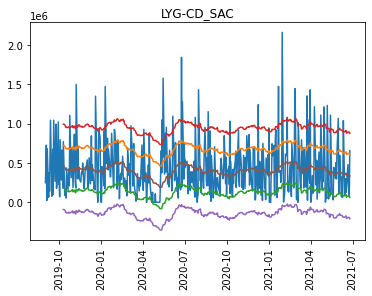

...

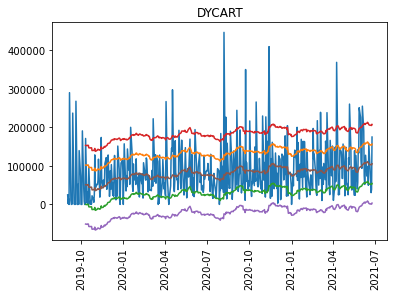

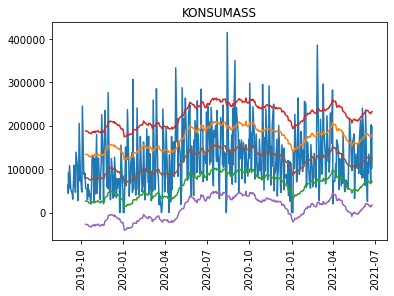

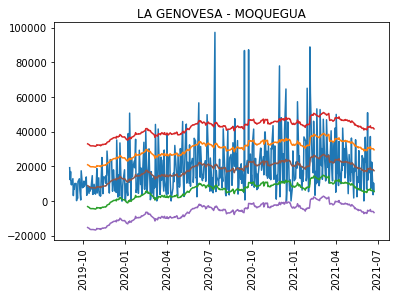

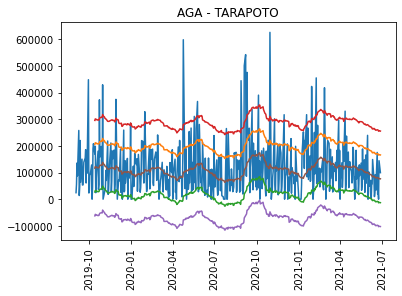

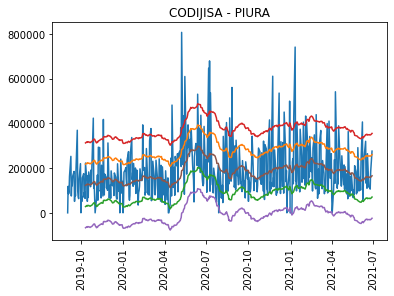

In [21]:
for i in dataset.Distribuidor.unique():
    subset = dataset[dataset['Distribuidor']==i].drop('Distribuidor',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [22]:
model_pycaret(dataset,target="Toneladas",level="Distribuidor")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.4742,0.3329,0.5770,0.0561,0.0438,0.0388
1,0.5752,0.6260,0.7912,-0.4355,0.0647,0.0477
2,0.3474,0.2206,0.4696,0.1423,0.0369,0.0295
3,0.3397,0.3030,0.5505,0.0831,0.0429,0.0280
4,0.4347,0.3734,0.6111,-0.2245,0.0479,0.0365
5,1.0469,13.1249,3.6228,-0.1100,0.1200,0.1365
6,0.6129,0.6491,0.8057,-2.7240,0.0644,0.0516
7,0.5183,0.3778,0.6146,-0.2279,0.0484,0.0430
8,0.5331,0.5980,0.7733,-0.8171,0.0608,0.0436
9,0.6279,0.6337,0.7960,-1.2769,0.0631,0.0525


In [23]:
concat_df = call_model(dataset,target="Toneladas",level="Distribuidor")

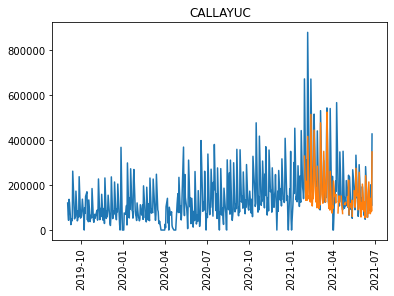

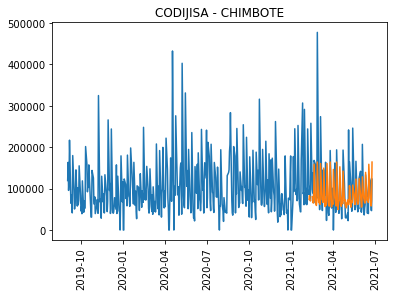

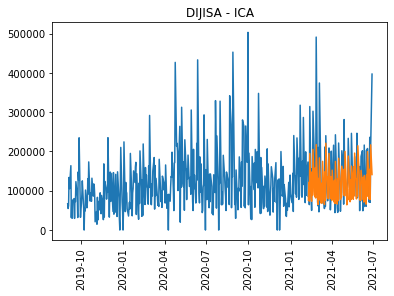

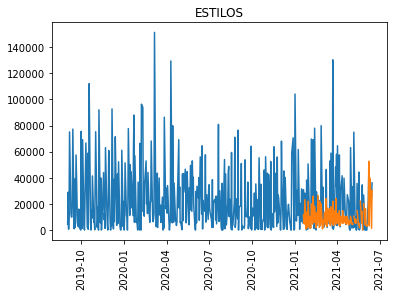

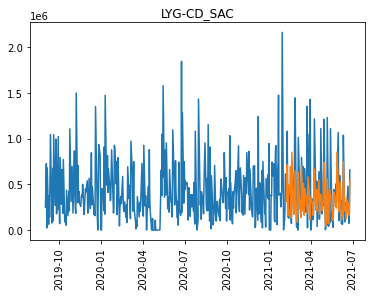

...

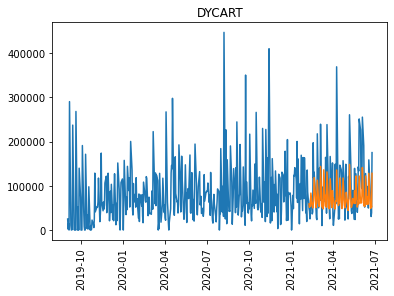

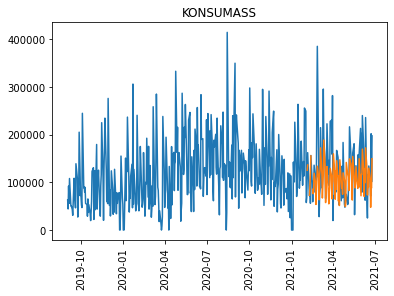

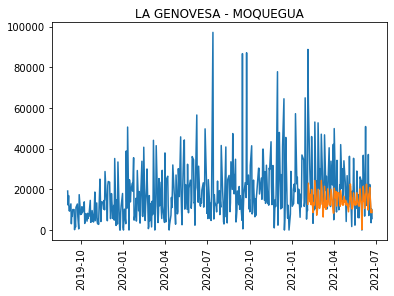

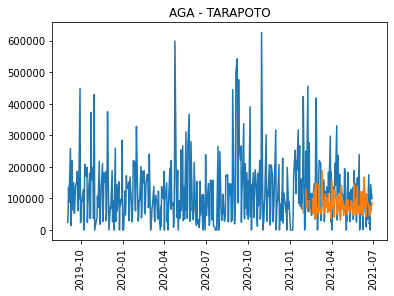

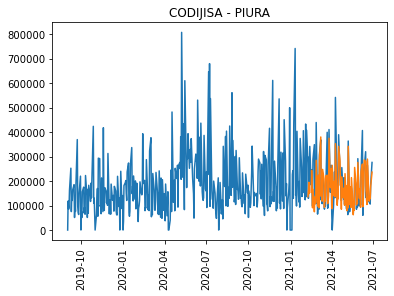

In [24]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Distribuidor'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# Region

In [25]:
dataset = pd.read_csv("../dataset/Toneladas/region.csv",index_col=0,parse_dates=["Fecha"])

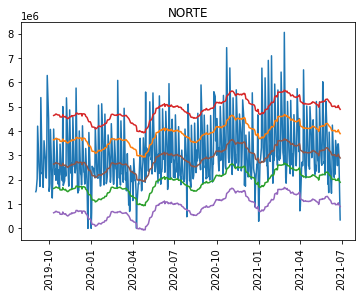

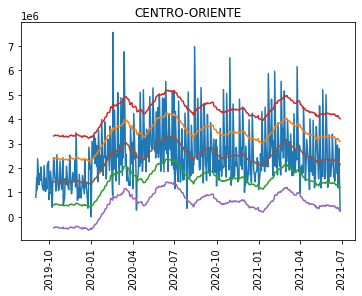

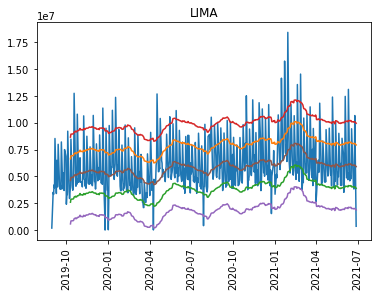

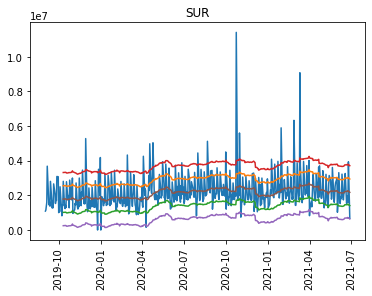

In [26]:
for i in dataset.Region.unique():
    subset = dataset[dataset['Region']==i].drop('Region',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [27]:
model_pycaret(dataset,target="Toneladas",level="Region")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.1716,0.0498,0.2232,0.5545,0.0143,0.0118
1,0.2677,0.1946,0.4411,-0.3156,0.0297,0.0188
2,0.2803,0.1827,0.4274,0.0659,0.0275,0.0190
3,0.2191,0.1217,0.3489,0.3509,0.0217,0.0147
4,0.2890,0.1884,0.4341,-0.2686,0.0293,0.0202
5,0.2608,0.1068,0.3269,0.3729,0.0208,0.0177
6,0.2273,0.0806,0.2839,0.1887,0.0184,0.0157
7,0.2657,0.1423,0.3772,0.3627,0.0245,0.0184
8,0.2068,0.0752,0.2742,-0.1036,0.0177,0.0143
9,0.4793,1.8797,1.3710,0.0071,0.1146,0.0492


In [28]:
concat_df = call_model(dataset,target="Toneladas",level="Region")

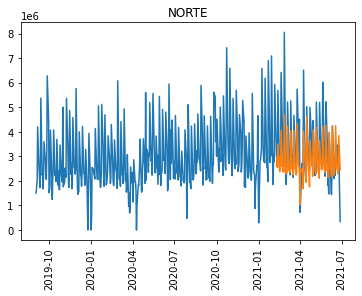

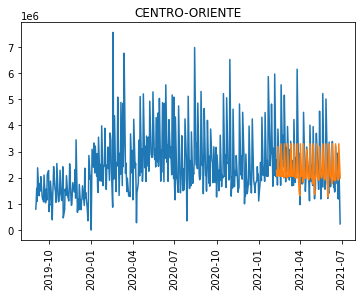

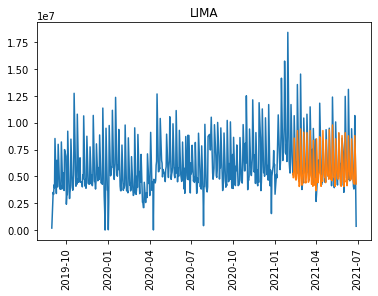

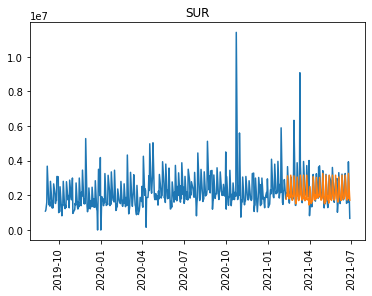

In [29]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['Region'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

# SKU

In [30]:
dataset = pd.read_csv("../dataset/Toneladas/sku.csv",index_col=0,parse_dates=["Fecha"])

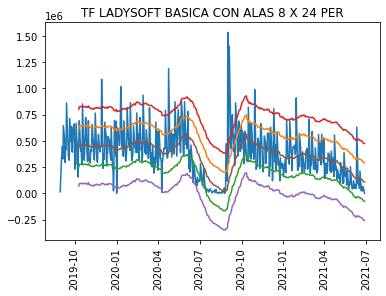

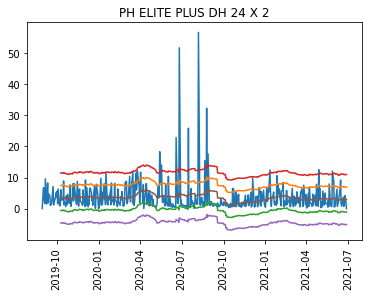

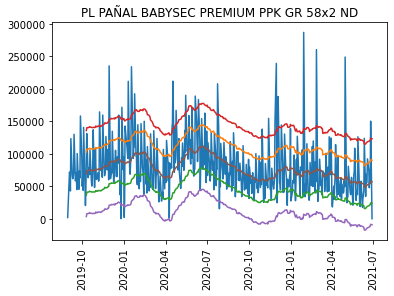

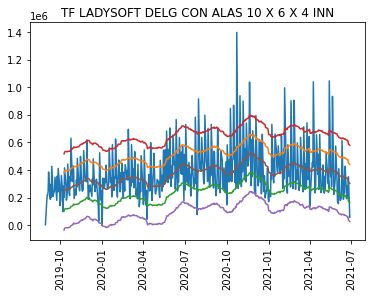

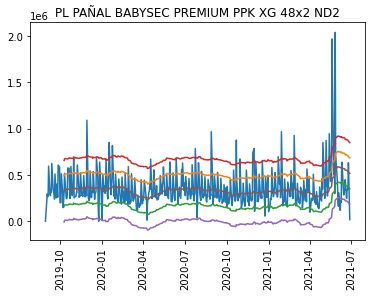

...

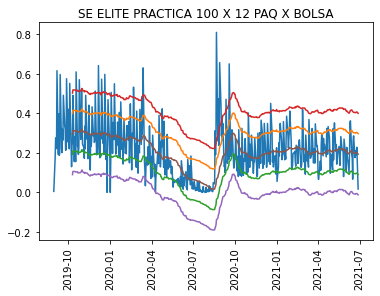

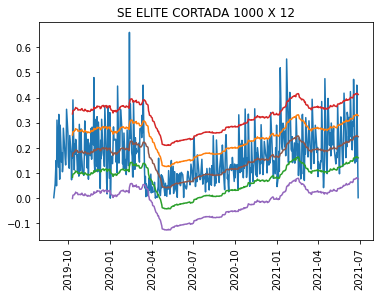

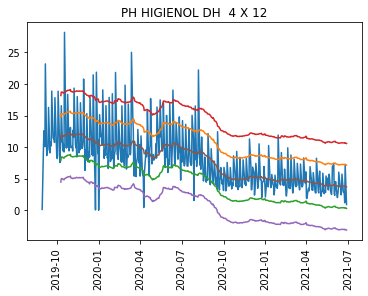

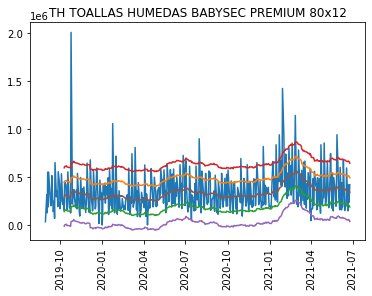

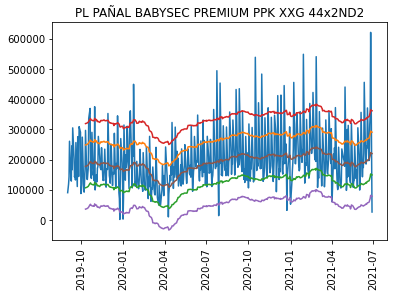

In [31]:
for i in dataset.SKU.unique():
    subset = dataset[dataset['SKU']==i].drop('SKU',axis=1).set_index('Fecha')
    std = np.std(subset['Toneladas'])
    subset = subset.resample('B').sum()
    subset['moving_average'] = subset['Toneladas'].rolling(30).mean()
    plt.plot(subset['Toneladas'])
    plt.plot(subset["moving_average"] + std)
    plt.plot(subset["moving_average"] - std)
    plt.plot(subset["moving_average"] + 2*std)
    plt.plot(subset["moving_average"] - 2*std)
    plt.plot(subset["moving_average"])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

In [32]:
model_pycaret(dataset,target="Toneladas",level="SKU")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2260,0.1157,0.3401,0.0347,0.0262,0.0187
1,0.2929,0.3034,0.5508,0.0157,0.0455,0.0263
2,0.3064,0.1492,0.3862,0.3772,0.0299,0.0253
3,0.2133,0.0718,0.2679,0.6112,0.0206,0.0176
4,0.3141,0.1831,0.4279,0.3135,0.0331,0.0265
5,0.3293,0.2438,0.4937,0.1456,0.0387,0.0275
6,0.2955,0.1436,0.3789,0.1552,0.0290,0.0245
7,0.2446,0.1669,0.4085,0.4276,0.0329,0.0211
8,0.3571,0.2731,0.5225,-1.0487,0.0404,0.0299
9,0.5719,1.1664,1.0800,0.0640,0.0987,0.0588


In [33]:
concat_df = call_model(dataset,target="Toneladas",level="SKU")

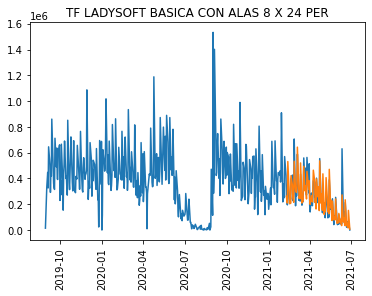

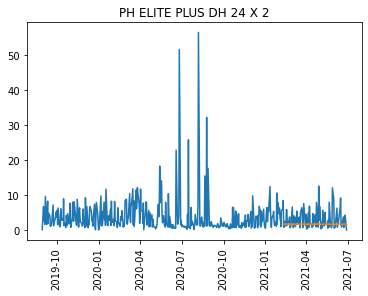

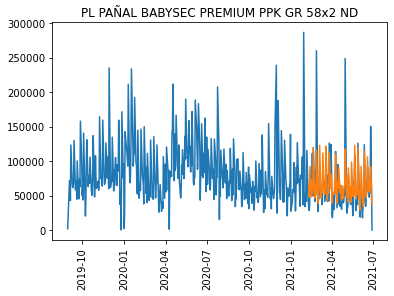

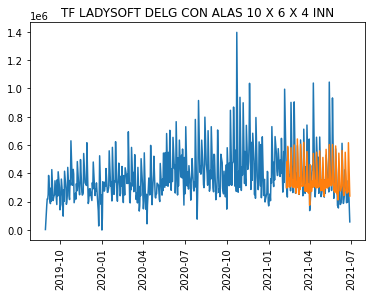

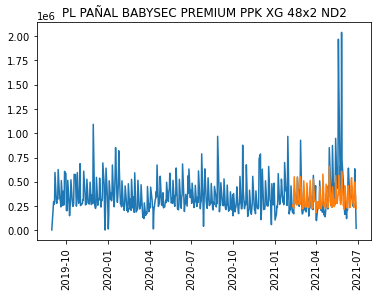

...

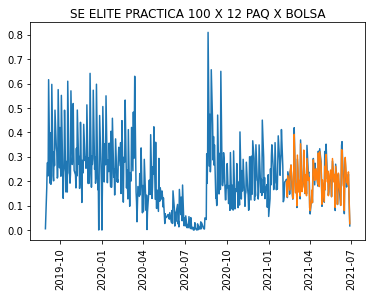

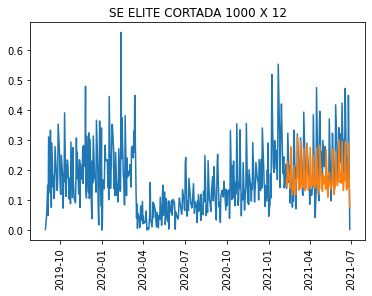

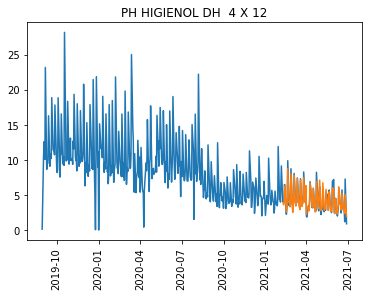

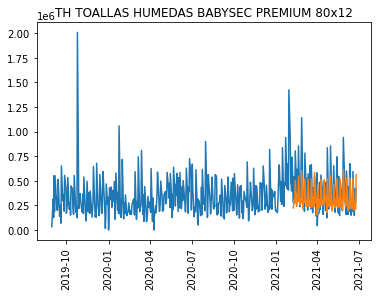

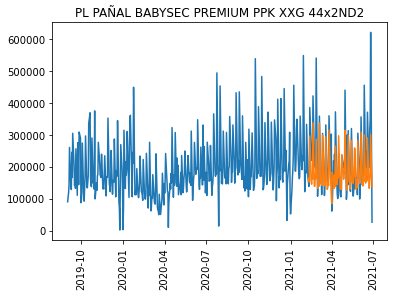

In [34]:
for i in concat_df['time_series'].unique():
    sub_df_1 = concat_df[concat_df['time_series']==i][['Label']]
    sub_df_2 = dataset[dataset['SKU'] == i].set_index('Fecha')[['Toneladas']]
    sub_df_2 = sub_df_2.resample('B').sum()
    sub_df = pd.concat([sub_df_1,sub_df_2],axis=1)
    plt.plot(sub_df[['Toneladas', 'Label']])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()